# Part 1: Multiscale Entropy Analysis

In [1]:
# Add directory above current directory to path
import sys; 
if not ".." in sys.path:
    sys.path.insert(0, '..')
    
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from scipy import stats

sns.set(style="darkgrid")

from utils.data_utils import *
from utils.time_utils import *
from utils.plot_utils import tsplot_periodogram

%load_ext autoreload
%autoreload 2

#run this cell for fullscreen jupyter cells
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
def prepare_result(customer_data, result_data):
    """
    Concatenate customer base frame with entropy result frame for quick Seaborn plot building
    """
    
    dfs = [customer_data, result_data]
    
    return pd.concat(dfs, axis=1)

In [3]:
#set up data and result paths
customer_base_path = "../DATA_GYM/sanitized_customer_base.csv"
login_data_path = "../DATA_GYM/sanitized_login_data.csv"
result_folder = "../results/regularity/statistics/2020-04-21/"

In [4]:
login_data = load_login_data(login_data_path)
customer_data = load_customer_data(customer_base_path)

In [5]:
#convert the timedelta columns to floats
customer_data["CONTRACT_DURATION"] = customer_data.apply(lambda x: x.CONTRACT_DURATION / pd.Timedelta(days=1), axis=1)
customer_data["ACTIVE_DURATION"] = customer_data.apply(lambda x: x.ACTIVE_DURATION / pd.Timedelta(days=1), axis=1)
customer_data["VISITS_PER_DAY"] = customer_data.apply(lambda x: x.NUM_VISITS / x.CONTRACT_DURATION, axis=1)

In [6]:
name = "multiscale_entropy_results"
freq = "30D"
file_ext = ".csv"
multiscale_entropy_stats = load_result_data(result_folder + name + "_" + freq + file_ext) 

In [7]:
result = prepare_result(customer_data, multiscale_entropy_stats)
result.describe()

,CONTRACT_DURATION,ACTIVE_DURATION,NUM_VISITS,VISITS_PER_DAY,Multiscale_ApEn_m=3_r=0.2,last_ApEn_scale,Multiscale_SampEn_m=3_r=0.2,last_SampEn_scale,Multiscale_PermEn_n=7_lag=1,last_PermEn_scale
count,138563.000000,138563.000000,138563.000000,138563.000000,138563.000000,138563.000000,138563.000000,138563.000000,138563.000000,138563.000000
mean,611.660592,449.568978,63.952253,0.114485,9.026599,32.256259,5.853084,31.706790,7.085113,30.410492
std,551.323127,508.445904,99.670243,0.113991,4.311934,3.163488,5.471439,4.182805,4.269775,5.836814
min,30.000000,-19.506111,1.000000,0.000207,0.000000,14.000000,0.000000,11.000000,0.000000,9.000000
25%,191.000000,90.000000,10.000000,0.032680,6.383220,33.000000,1.638328,33.000000,3.398339,33.000000
50%,425.000000,256.000000,28.000000,0.079296,9.306281,33.000000,3.626464,33.000000,6.741438,33.000000
75%,886.331609,625.000000,74.000000,0.160968,11.707932,33.000000,8.426056,33.000000,10.421470,33.000000
max,5848.331609,5842.000000,2089.000000,2.750000,27.180826,33.000000,20.859789,33.000000,17.933854,33.000000


In [8]:
cd_normalizer = colors.LogNorm(vmin=result["CONTRACT_DURATION"].min(), vmax=result["CONTRACT_DURATION"].max())
nv_normalizer = colors.LogNorm(vmin=result["NUM_VISITS"].min(), vmax=result["NUM_VISITS"].max())
vpd_normalizer = colors.LogNorm(vmin=result["VISITS_PER_DAY"].min(), vmax=result["VISITS_PER_DAY"].max())

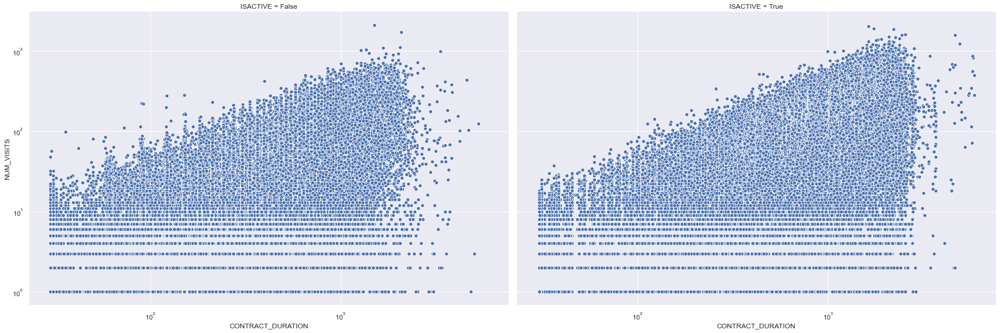

In [10]:
g = sns.relplot(x="CONTRACT_DURATION", y="NUM_VISITS", col="ISACTIVE", data=customer_data, height=8, aspect=1.5)
g.set(xscale="log", yscale="log")

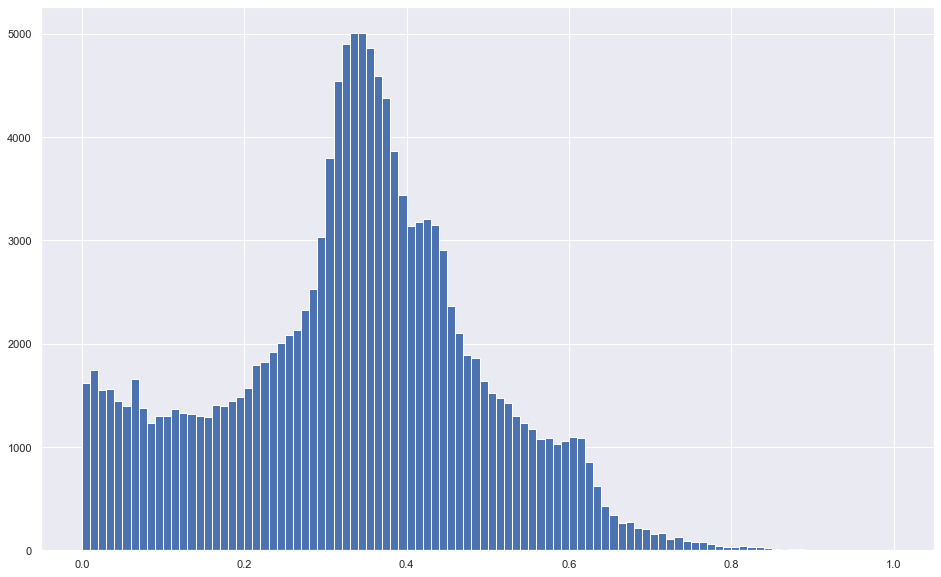

In [9]:
from sklearn.preprocessing import minmax_scale

feature = result["Multiscale_ApEn_m=3_r=0.2"]
#feature = feature[result.NUM_VISITS > 1]
norm_apen_feature = pd.Series(minmax_scale(feature), index=result.index)
norm_apen_feature.hist(bins=100, figsize=(16,10))

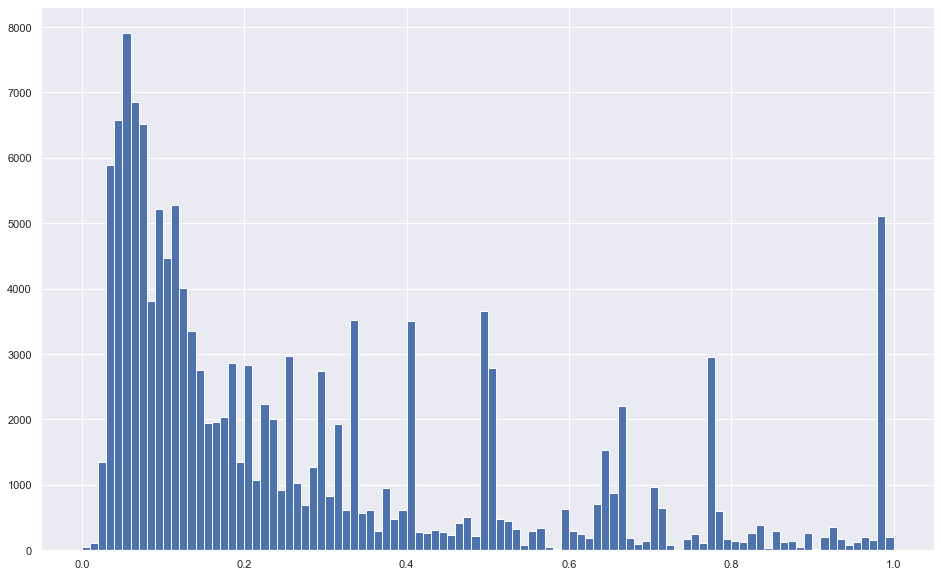

In [10]:
feature = result["Multiscale_SampEn_m=3_r=0.2"]
#feature = feature[result.NUM_VISITS > 1]
norm_sampen_feature = pd.Series(minmax_scale(feature), index=result.index)
norm_sampen_feature.hist(bins=100, figsize=(16,10))

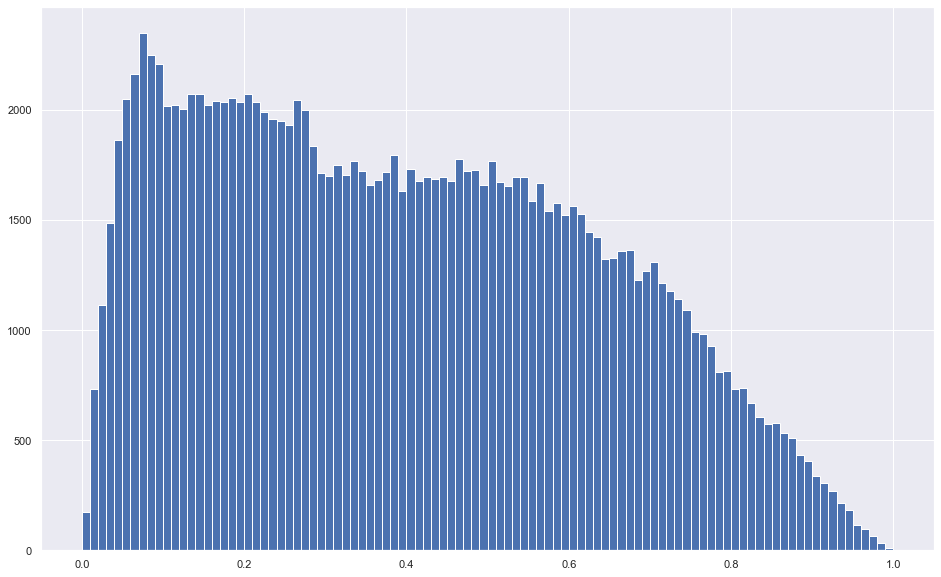

In [11]:
feature = result["Multiscale_PermEn_n=7_lag=1"]
#feature = feature[result.NUM_VISITS > 1]
norm_permen_feature = pd.Series(minmax_scale(feature), index=result.index)
norm_permen_feature.hist(bins=100, figsize=(16,10))

In [12]:
result["norm_apen_feature"] = norm_apen_feature
result["norm_sampen_feature"] = norm_sampen_feature
result["norm_permen_feature"] = norm_permen_feature

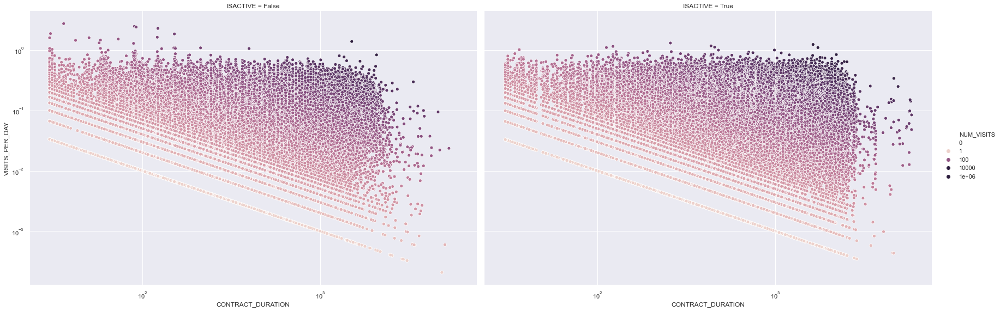

In [13]:
g2 = sns.relplot(x="CONTRACT_DURATION", y="VISITS_PER_DAY", col="ISACTIVE", hue="NUM_VISITS",hue_norm=nv_normalizer, data=customer_data, height=8, aspect=1.5)
g2.set(xscale="log", yscale="log")

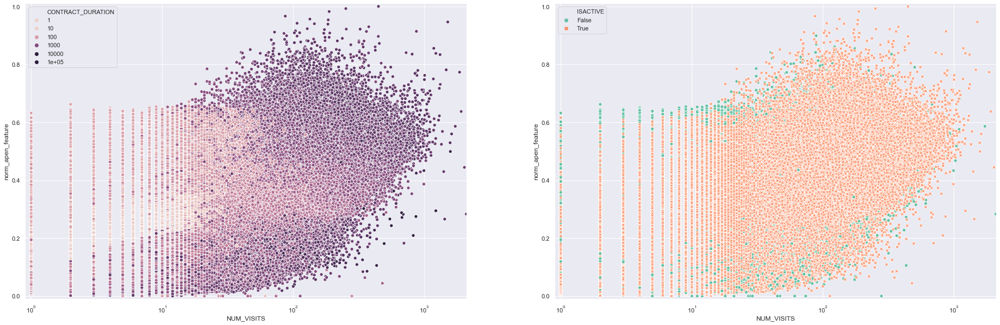

In [14]:
# Initialize figure and ax
# Set up the matplotlib figure
fig1, (ax1, ax2) = plt.subplots(1, 2, figsize=(32,10), sharex=True)

# Set the scale of the x-and y-axes
ax1.set(xscale="log", xlim=(0.9, 2100), ylim=(-0.01,1.01))
ax2.set(xscale="log", xlim=(0.9, 2100), ylim=(-0.01,1.01))
sns.scatterplot(x="NUM_VISITS", y="norm_apen_feature", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=result, ax=ax1)
sns.scatterplot(x="NUM_VISITS", y="norm_apen_feature", hue="ISACTIVE", style="ISACTIVE", palette="Set2", data=result, ax=ax2)

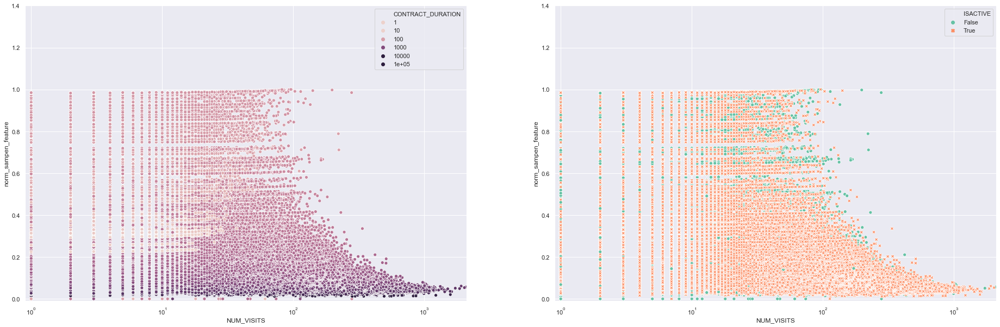

In [15]:
# Initialize figure and ax
# Set up the matplotlib figure
fig2, (ax3, ax4) = plt.subplots(1, 2, figsize=(32,10), sharex=True)

# Set the scale of the x-and y-axes
ax3.set(xscale="log", xlim=(0.9, 2100), ylim=(-0.01,1.4))
ax4.set(xscale="log", xlim=(0.9, 2100), ylim=(-0.01,1.4))
sns.scatterplot(x="NUM_VISITS", y="norm_sampen_feature", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=result, ax=ax3)
sns.scatterplot(x="NUM_VISITS", y="norm_sampen_feature", hue="ISACTIVE", style="ISACTIVE", palette="Set2", data=result, ax=ax4)

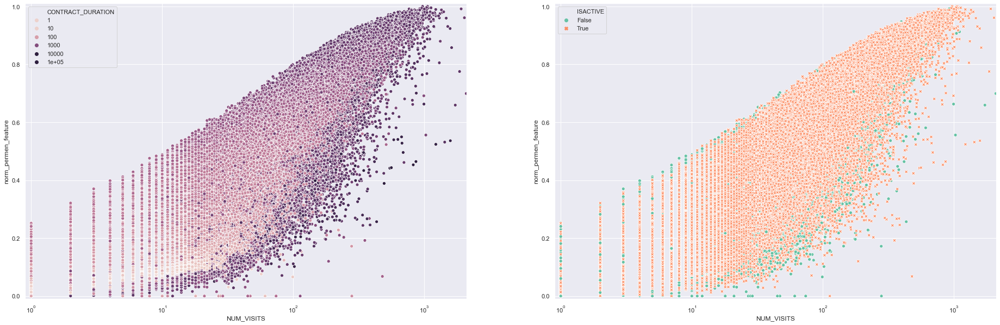

In [16]:
# Initialize figure and ax
# Set up the matplotlib figure
fig3, (ax5, ax6) = plt.subplots(1, 2, figsize=(32,10), sharex=True)

# Set the scale of the x-and y-axes
ax5.set(xscale="log", xlim=(0.9, 2100), ylim=(-0.01,1.01))
ax6.set(xscale="log", xlim=(0.9, 2100), ylim=(-0.01,1.01))
sns.scatterplot(x="NUM_VISITS", y="norm_permen_feature", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=result, ax=ax5)
sns.scatterplot(x="NUM_VISITS", y="norm_permen_feature", hue="ISACTIVE", style="ISACTIVE", palette="Set2", data=result, ax=ax6)

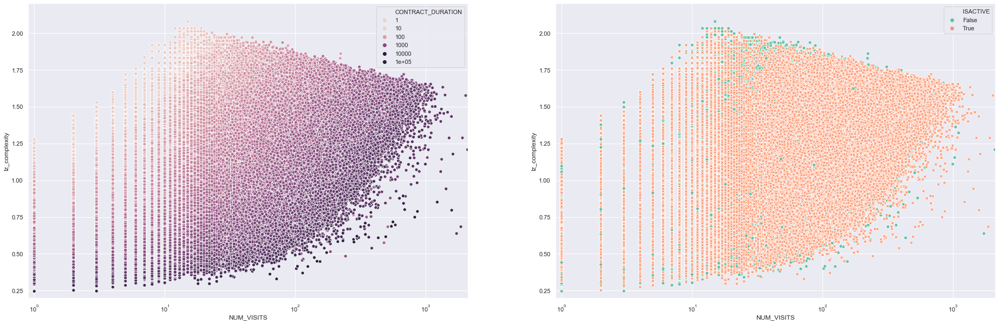

In [16]:
# Initialize figure and ax
# Set up the matplotlib figure
fig4, (ax7, ax8) = plt.subplots(1, 2, figsize=(32,10), sharex=True)

# Set the scale of the x-and y-axes
ax7.set(xscale="log", xlim=(0.9, 2100), ylim=(0.2,2.2))
ax8.set(xscale="log", xlim=(0.9, 2100), ylim=(0.2,2.2))
sns.scatterplot(x="NUM_VISITS", y="lz_complexity", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=binreg_result, ax=ax7)
sns.scatterplot(x="NUM_VISITS", y="lz_complexity", hue="ISACTIVE", style="ISACTIVE", palette="Set2", data=binreg_result, ax=ax8)

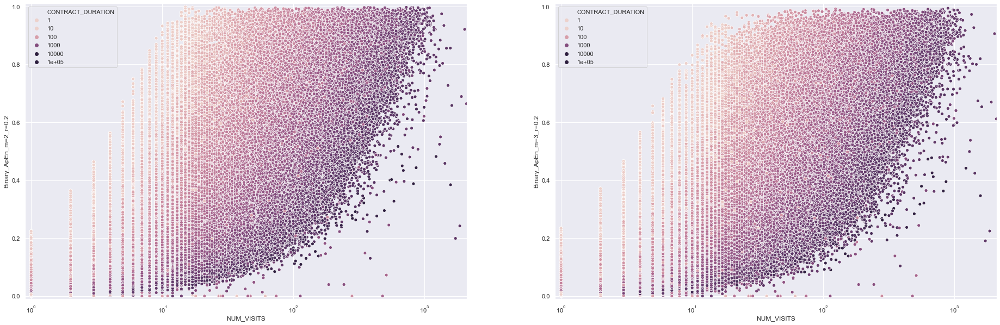

In [18]:
# Initialize figure and ax
# Set up the matplotlib figure
fig5, (ax9, ax10) = plt.subplots(1, 2, figsize=(32,10), sharex=True)

# Set the scale of the x-and y-axes
ax9.set(xscale="log", xlim=(0.9, 2100), ylim=(-0.01,1.01))
ax10.set(xscale="log", xlim=(0.9, 2100), ylim=(-0.01,1.01))
sns.scatterplot(x="NUM_VISITS", y="Binary_ApEn_m=2_r=0.2", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=binreg_result, ax=ax9)
sns.scatterplot(x="NUM_VISITS", y="Binary_ApEn_m=3_r=0.2", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=binreg_result, ax=ax10)

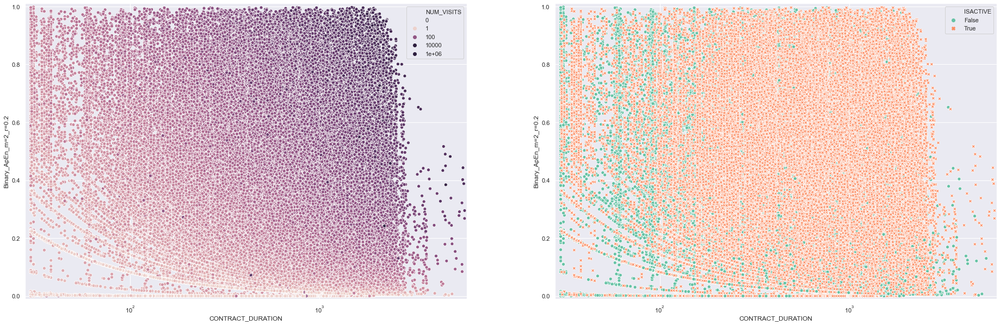

In [19]:
# Initialize figure and ax
# Set up the matplotlib figure
fig6, (ax11, ax12) = plt.subplots(1, 2, figsize=(32,10), sharex=True)

# Set the scale of the x-and y-axes
ax11.set(xscale="log", xlim=(28, 6000), ylim=(-0.01,1.01))
ax12.set(xscale="log", xlim=(28, 6000), ylim=(-0.01,1.01))
sns.scatterplot(x="CONTRACT_DURATION", y="Binary_ApEn_m=2_r=0.2", hue="NUM_VISITS", hue_norm=nv_normalizer, data=binreg_result, ax=ax11)
sns.scatterplot(x="CONTRACT_DURATION", y="Binary_ApEn_m=2_r=0.2", hue="ISACTIVE", style="ISACTIVE", palette="Set2", data=binreg_result, ax=ax12)

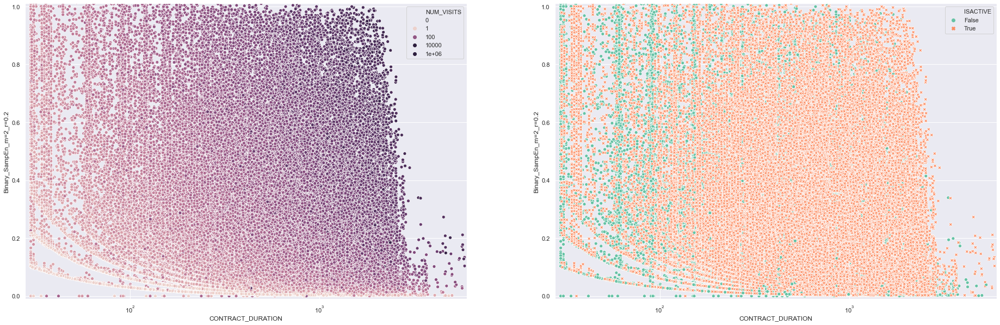

In [21]:
# Initialize figure and ax
# Set up the matplotlib figure
fig7, (ax13, ax14) = plt.subplots(1, 2, figsize=(32,10), sharex=True)

# Set the scale of the x-and y-axes
ax13.set(xscale="log", xlim=(28, 6000), ylim=(-0.01,1.01))
ax14.set(xscale="log", xlim=(28, 6000), ylim=(-0.01,1.01))
sns.scatterplot(x="CONTRACT_DURATION", y="Binary_SampEn_m=2_r=0.2", hue="NUM_VISITS", hue_norm=nv_normalizer, data=binreg_result, ax=ax13)
sns.scatterplot(x="CONTRACT_DURATION", y="Binary_SampEn_m=2_r=0.2", hue="ISACTIVE", style="ISACTIVE", palette="Set2", data=binreg_result, ax=ax14)

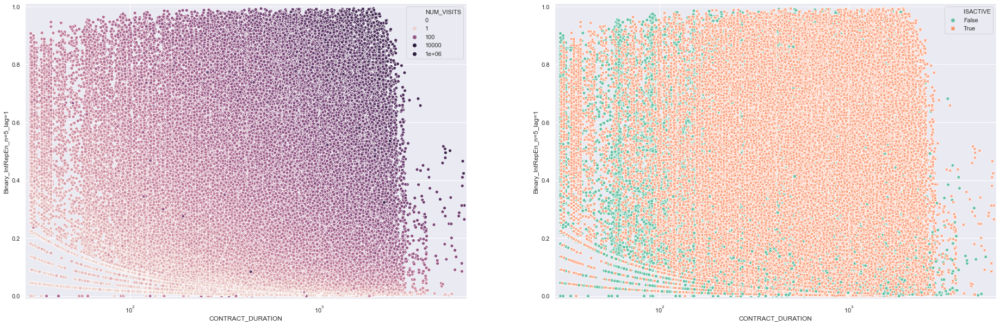

In [22]:
# Initialize figure and ax
# Set up the matplotlib figure
fig8, (ax15, ax16) = plt.subplots(1, 2, figsize=(32,10), sharex=True)

# Set the scale of the x-and y-axes
ax15.set(xscale="log", xlim=(28, 6000), ylim=(-0.01,1.01))
ax16.set(xscale="log", xlim=(28, 6000), ylim=(-0.01,1.01))
sns.scatterplot(x="CONTRACT_DURATION", y="Binary_IntRepEn_n=5_lag=1", hue="NUM_VISITS", hue_norm=nv_normalizer, data=binreg_result, ax=ax15)
sns.scatterplot(x="CONTRACT_DURATION", y="Binary_IntRepEn_n=5_lag=1", hue="ISACTIVE", style="ISACTIVE", palette="Set2", data=binreg_result, ax=ax16)

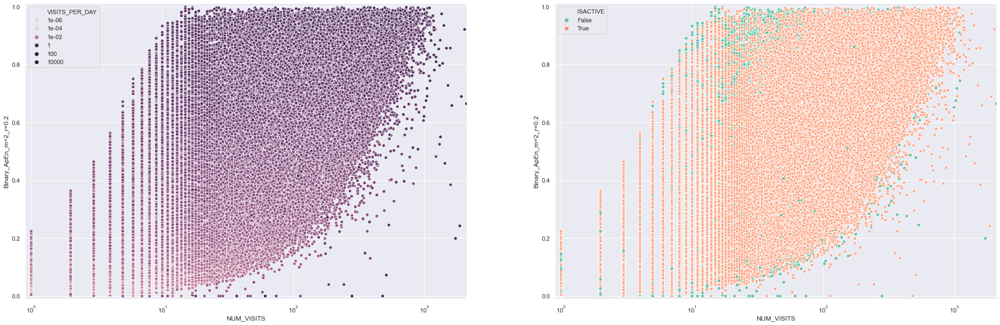

In [23]:
# Initialize figure and ax
# Set up the matplotlib figure
fig9, (ax17, ax18) = plt.subplots(1, 2, figsize=(32,10), sharex=True)

# Set the scale of the x-and y-axes
ax17.set(xscale="log", xlim=(0.9, 2100), ylim=(-0.01,1.01))
ax18.set(xscale="log", xlim=(0.9, 2100), ylim=(-0.01,1.01))
sns.scatterplot(x="NUM_VISITS", y="Binary_ApEn_m=2_r=0.2", hue="VISITS_PER_DAY", hue_norm=vpd_normalizer, data=binreg_result, ax=ax17)
sns.scatterplot(x="NUM_VISITS", y="Binary_ApEn_m=2_r=0.2", hue="ISACTIVE", style="ISACTIVE", palette="Set2", data=binreg_result, ax=ax18)

In [22]:
stat_name = "norm_apen_feature"
n = 100
sample = result[result.NUM_VISITS > 50].nsmallest(n, stat_name).sample(1)
sample_code = sample.index[0]
print(sample[stat_name])
print(sample_code)

2601635.38    0.04189
Name: norm_apen_feature, dtype: float64
2601635.38


In [25]:
fs = 24.0
classical_config = {"fs": fs, "window": "hann", "window_size": 7*14, "detrend": "constant", "scaling": "density", "mode": "none"}
welch_config = {"fs": fs, "window": "hann", "nperseg": 512, "noverlap": None, "nfft": 1024, "detrend": "constant", "scaling": "density"}

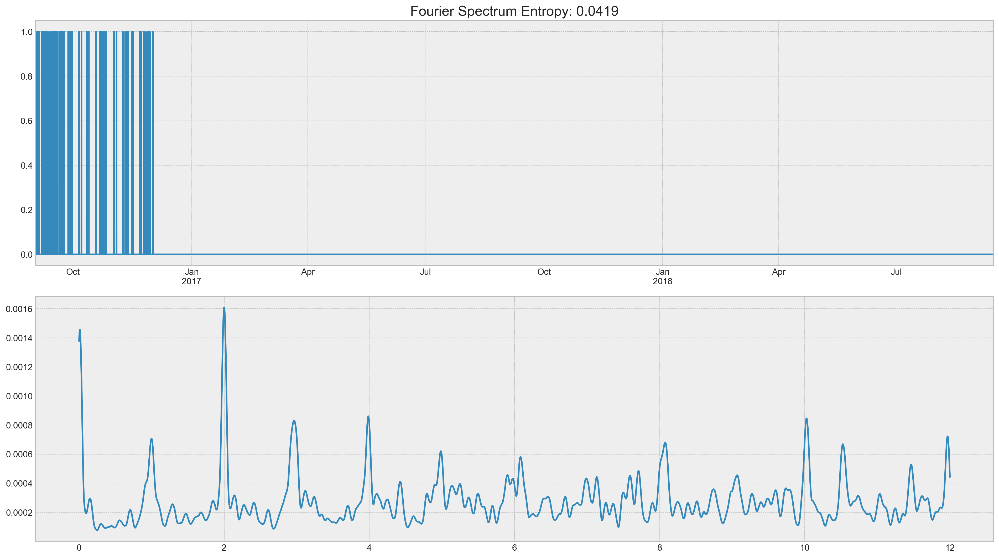

In [26]:
tsplot_periodogram(sample_code, result, login_data, stat_name, freq="1H", p_type="classical", **classical_config)

In [20]:
customer_logins = login_data[login_data["CUST_CODE"] == sample_code].sort_values(by="DATE_SAVED")
customer = result.loc[sample_code]
bin_series = construct_binary_visit_series(customer, customer_logins, login_data["DATE_SAVED"].max())

count    53.000000
mean      2.571723
std       1.950412
min       0.000058
25%       1.103472
50%       2.052222
75%       3.066586
max       9.007257
dtype: float64

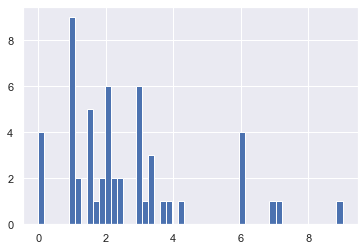

In [21]:
tds = get_timedeltas(customer_logins.DATE_SAVED)
tds[tds < 10].hist(bins=50)
tds.describe()